
... ***CURRENTLY UNDER DEVELOPMENT*** ...


## SWAN simulations

inputs required: 
  * Sea and swell selected cases from ***Notebook 02_01***

in this notebook:
  * SWAN mesh descriptions
  * SWAN simulations for sea and swell conditions
  * Read and store SWAN output at the location of study


### Workflow:

<div>
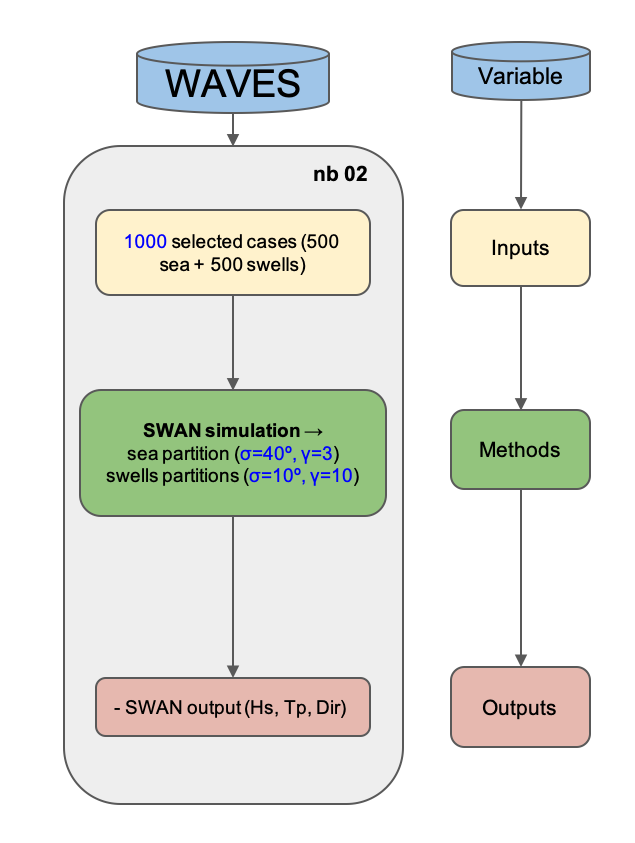
</div>




The SWAN model allows to simulate the wave propagation in nearshore areas (Booij et al., 1999). The design points from notebook 02_01 provide the boundary conditions for a series of simulations from the SWAN model. SWAN was run in stationary mode. Sea and Swell conditions have been simulated independently and summed linearly afterwards. 

In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

# common
import os
import os.path as op

# pip
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

# DEV: override installed teslakit
import sys
sys.path.insert(0, op.join(os.path.abspath(''), '..', '..', '..'))

# teslakit
from teslakit.database import Database, hyswan_db

# TODO: dev mw_deltares
sys.path.insert(0, '/Users/nico/Projects/BlueMath/mw_deltares/')

# mw_deltares custom toolbox
from mw_deltares.swan.wrap import SwanProject, SwanWrap_STAT
from mw_deltares.swan.plots.stat import scatter_maps


In [2]:
# "mw_deltares" needs a copy of SWAN executable to work,
# manually compile SWAN numerical model and use the "set_swan_binary_file" method

#from mw_deltares import swan
#swan.set_swan_binary_file('/Users/nico/Projects/BlueMath/mw_deltares/mw_deltares/swan/resources/swan_bin/swan_ser.exe')



## Database and Site parameters

In [3]:
# --------------------------------------
# Teslakit database

p_data = r'/Users/nico/Projects/TESLA-kit/TeslaKit/data'
db = Database(p_data)

# set site
db.SetSite('ROI')


# --------------------------------------
# hyswan databases

# historical
db_hist = hyswan_db(db.paths.site.HYSWAN.hist)

# simulation
db_sim = hyswan_db(db.paths.site.HYSWAN.sim)



## SWAN: site files, main and nested grid descriptions

In [4]:
# SWAN site bathymetry files
p_swan = db.paths.site.HYSWAN.swan_site
p_swan_ext = op.join(p_swan, 'Roinamur_ext_bottom.dat')
p_swan_int = op.join(p_swan, 'Roinamur_int_bottom.dat')

# SWAN site shore (for plots)
p_shore = op.join(p_swan, 'shore.npy')
np_shore = np.load(p_shore)

# SWAN grids description
main_grid = {
    'xpc': 166.6159,  # x origin
    'ypc': 8.4105,    # y origin
    'alpc': 0,        # x-axis direction 
    'xlenc': 1.3722,  # grid length in x
    'ylenc': 1.175,   # grid length in y
    'mxc': 137,       # number mesh x
    'myc': 118,       # number mesh y
    'dxinp': 0.01,    # size mesh x
    'dyinp': 0.01,    # size mesh y
}

nested_grid = {
    'xpc': 167.4059,
    'ypc': 9.3505,
    'alpc': 0,
    'xlenc': 0.12,
    'ylenc': 0.08,
    'mxc': 120,
    'myc': 80,
    'dxinp': 0.001,
    'dyinp': 0.001,
}



## SWAN: HISTORICAL SEA waves 

In [5]:
# load Historical sea MDA subset
wvs_sea_subset = db_hist.Load('sea_subset')


# waves data hs and spr
wvs_sea_subset['hs'] = 1
wvs_sea_subset['spr'] = 40
wvs_sea_subset.rename(columns={'tp':'per'}, inplace=True)  # rename Tp for swan wrapper


# swan project
p_swan = db_hist.paths['swan_projects']
sp = SwanProject(p_swan, 'sea')

# main mesh: depth and computational grid 
sp.mesh_main.dg = main_grid.copy()
sp.mesh_main.cg = main_grid.copy()
sp.mesh_main.depth = np.loadtxt(p_swan_ext)

# nested mesh: depth and computational grid 
sp.mesh_nest1.dg = nested_grid.copy()
sp.mesh_nest1.cg = nested_grid.copy()
sp.mesh_nest1.depth = np.loadtxt(p_swan_int)

# activate nested mesh
sp.run_nest1 = True


# SWAN parameters 
sp.params = {
    'sea_level': 0,
    'jonswap_gamma': 3,
    'coords_spherical': 'CCM',
    'waves_period': 'PEAK',
    'nested_bounds': 'CLOSED',
}

    
# SWAN project wrapper
sw = SwanWrap_STAT(sp)

# build and launch cases
sw.build_cases(wvs_sea_subset)
sw.run_cases()


SWAN CASE: 0000 ---> hs    1.00, per   22.06, dir  127.25, spr   40.00
SWAN CASE: 0001 ---> hs    1.00, per    1.82, dir  307.97, spr   40.00
SWAN CASE: 0002 ---> hs    1.00, per    1.67, dir  128.21, spr   40.00
SWAN CASE: 0003 ---> hs    1.00, per   11.29, dir  217.20, spr   40.00
SWAN CASE: 0004 ---> hs    1.00, per   10.97, dir   34.19, spr   40.00
SWAN CASE: 0005 ---> hs    1.00, per   11.84, dir  124.94, spr   40.00
SWAN CASE: 0006 ---> hs    1.00, per    1.57, dir   50.06, spr   40.00
SWAN CASE: 0007 ---> hs    1.00, per    3.26, dir  232.04, spr   40.00
SWAN CASE: 0008 ---> hs    1.00, per    6.92, dir  169.39, spr   40.00
SWAN CASE: 0009 ---> hs    1.00, per    5.68, dir  357.26, spr   40.00
SWAN CASE: 0010 ---> hs    1.00, per   18.13, dir  172.51, spr   40.00
SWAN CASE: 0011 ---> hs    1.00, per    7.49, dir  280.52, spr   40.00
SWAN CASE: 0012 ---> hs    1.00, per    6.57, dir   91.91, spr   40.00
SWAN CASE: 0013 ---> hs    1.00, per   17.01, dir  107.88, spr   40.00
SWAN C

<xarray.Dataset>
Dimensions:  (case: 25, lat: 118, lon: 137)
Coordinates:
  * lon      (lon) float64 166.6 166.6 166.6 166.6 ... 167.9 168.0 168.0 168.0
  * lat      (lat) float64 8.411 8.42 8.43 8.44 8.45 ... 9.546 9.556 9.566 9.576
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 0.9640554 0.96351606 ... 0.82078874
    Tm02     (case, lon, lat) float32 16.898996 16.896381 ... 4.7766814 4.753085
    Dir      (case, lon, lat) float32 130.82195 130.89825 ... 188.9302 188.91139
    Dspr     (case, lon, lat) float32 35.599056 35.53772 ... 37.864964 38.004494
    TPsmoo   (case, lon, lat) float32 21.628626 21.62843 ... 5.806756 5.8066387


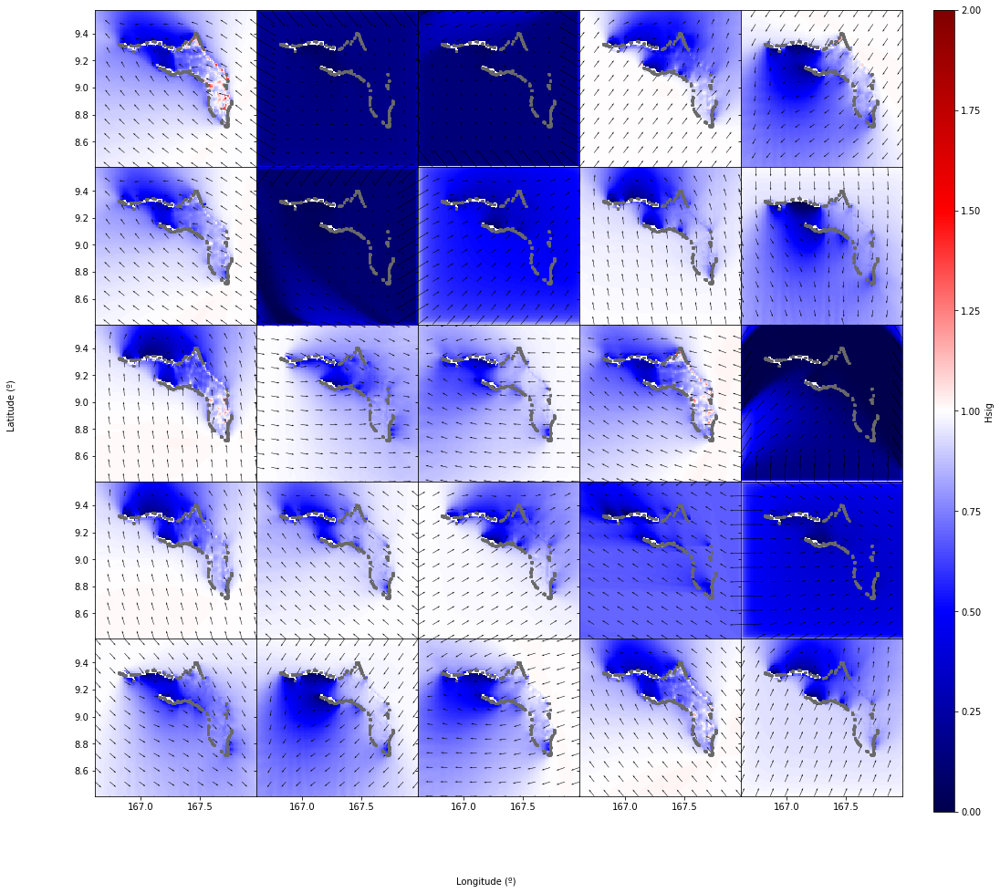

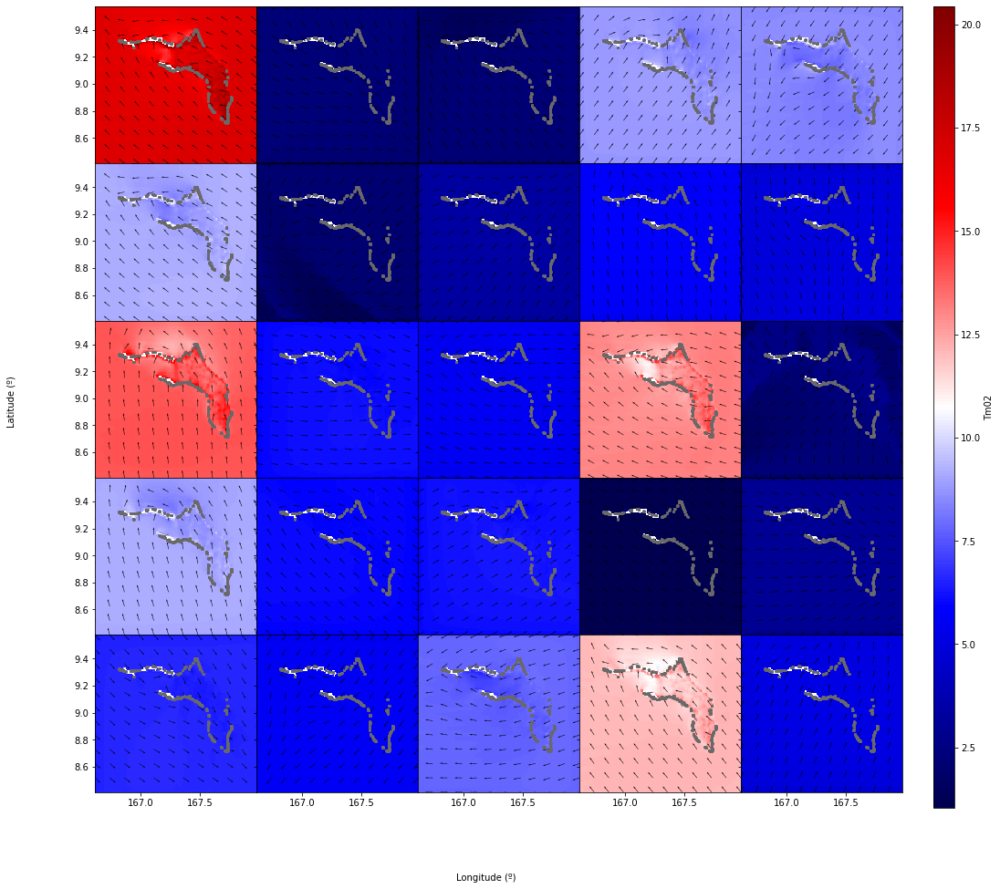

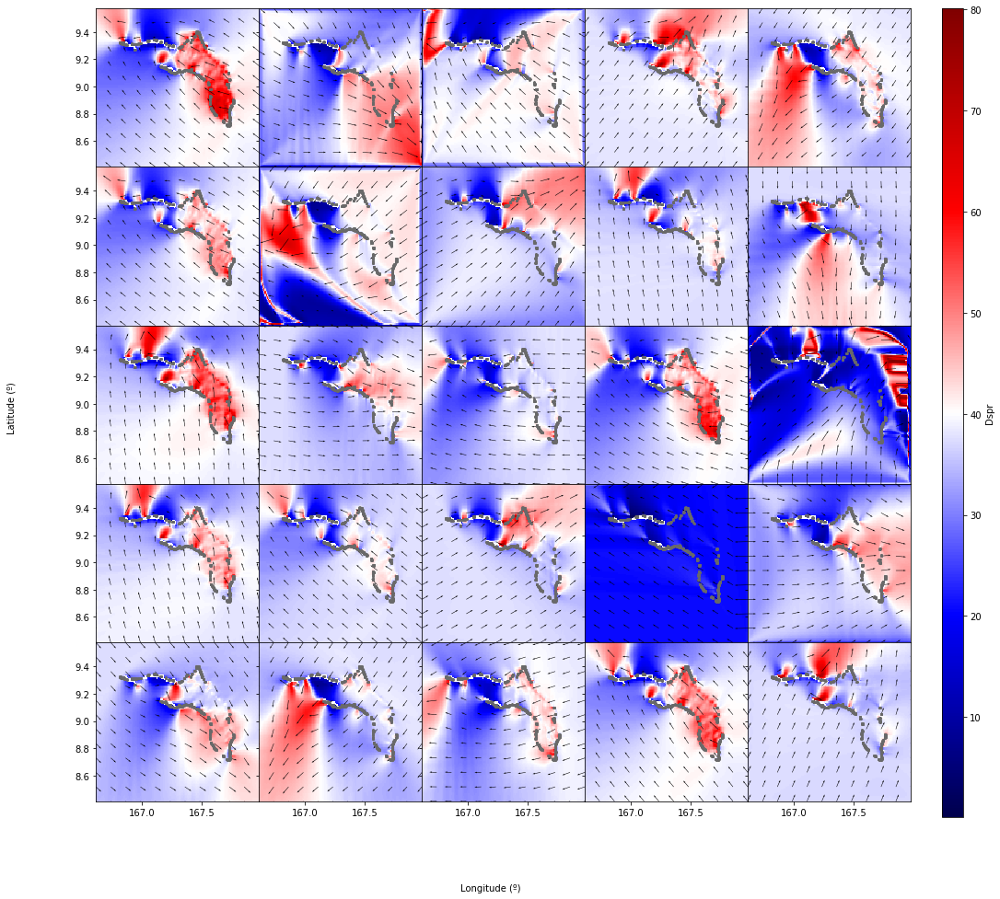

In [6]:
# extract output for main mesh
out_sea_mm_hist = sw.extract_output()
out_sea_mm_hist.to_netcdf(op.join(p_swan, 'out_main_sea.nc'))
print(out_sea_mm_hist)

# plot scatter maps
scatter_maps(out_sea_mm_hist, n_cases=25, var_limits={'Hsig':(0,2)}, np_shore=np_shore);


<xarray.Dataset>
Dimensions:  (case: 25, lat: 80, lon: 120)
Coordinates:
  * lon      (lon) float64 167.4 167.4 167.4 167.4 ... 167.5 167.5 167.5 167.5
  * lat      (lat) float64 9.351 9.351 9.353 9.354 ... 9.427 9.428 9.429 9.43
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 0.5193764 0.4594521 ... 0.36745587
    Tm02     (case, lon, lat) float32 16.526276 15.746195 ... 5.0421963 5.069114
    Dir      (case, lon, lat) float32 102.454315 103.283936 ... 205.60677
    Dspr     (case, lon, lat) float32 44.17859 47.127365 ... 41.70135 26.588482
    TPsmoo   (case, lon, lat) float32 21.495134 21.46257 ... 5.8345194 5.8345494


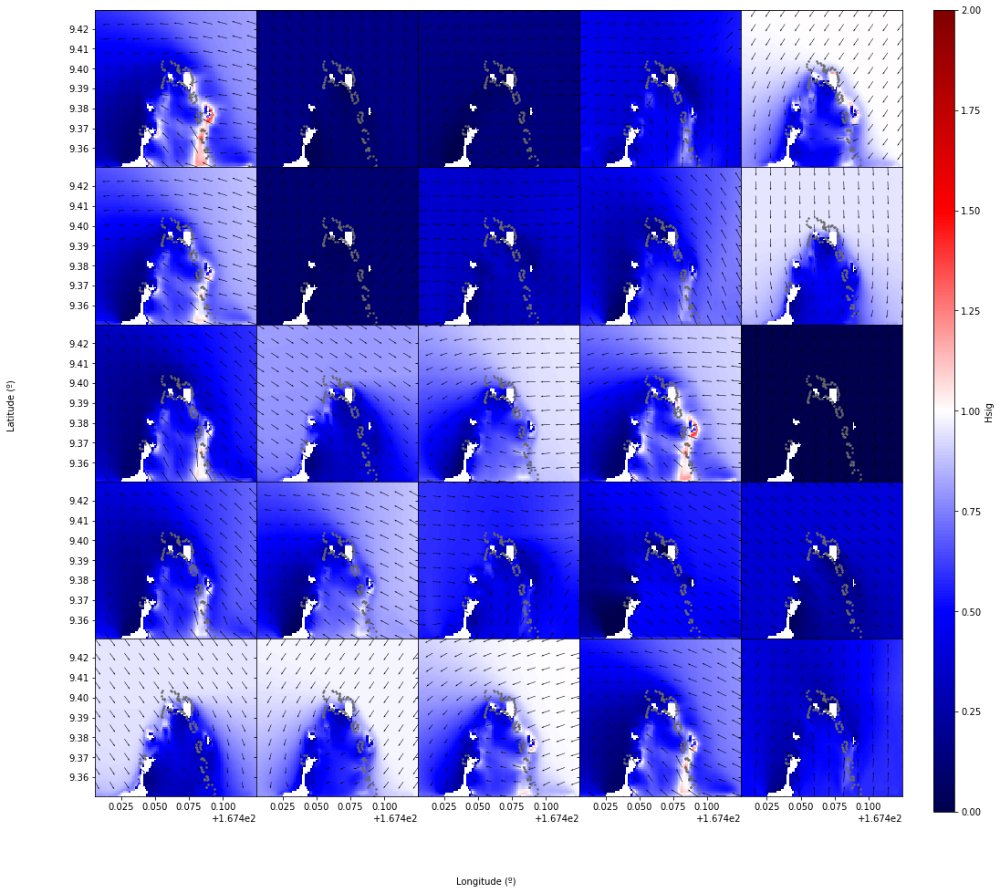

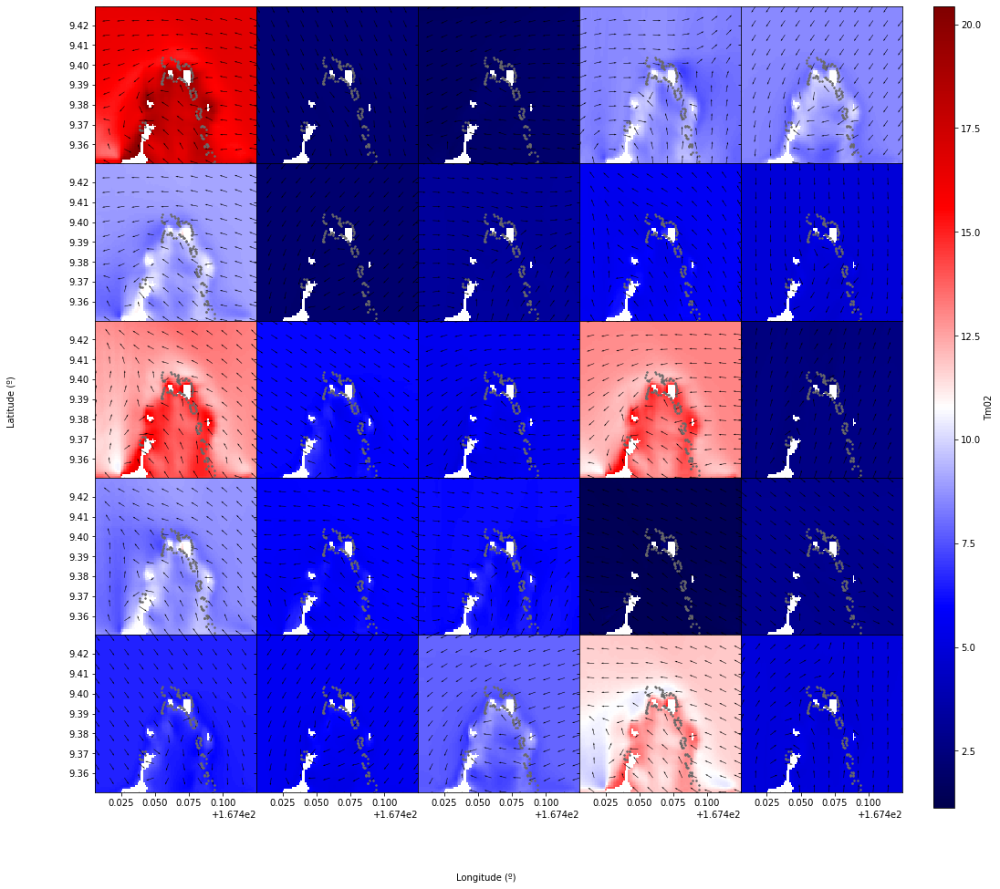

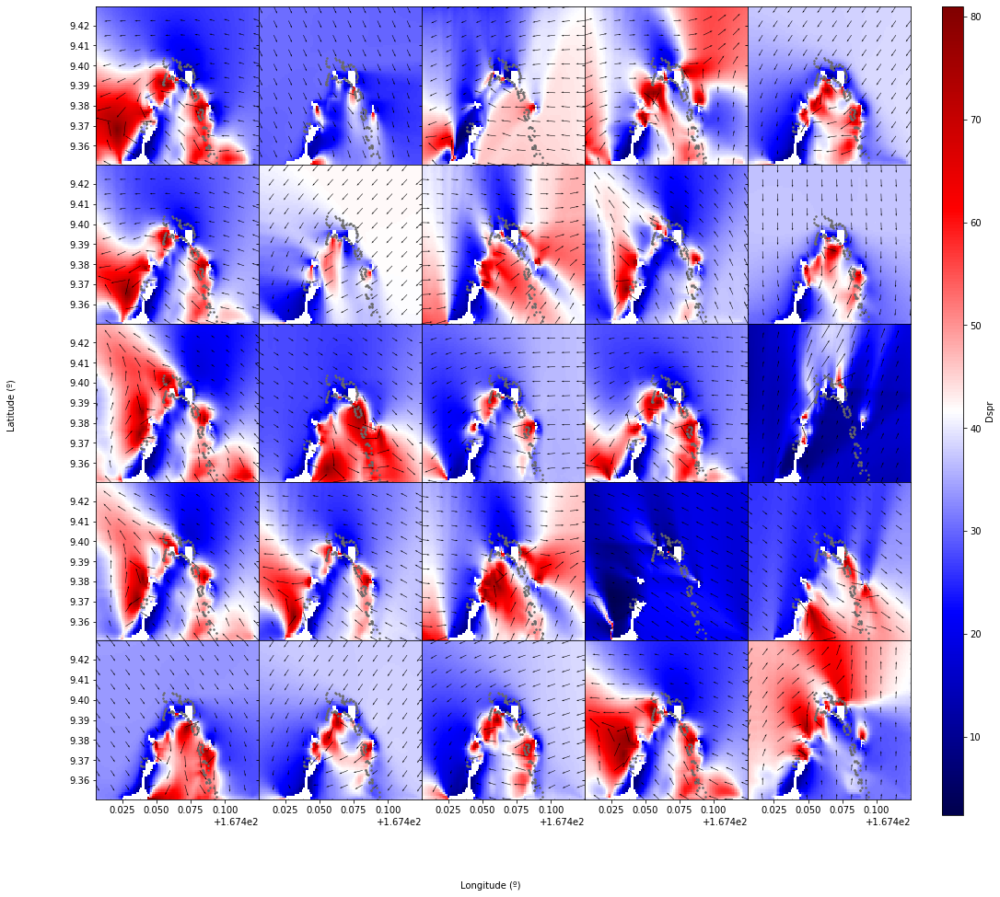

In [7]:
# extract output for nested mesh
out_sea_mn1_hist = sw.extract_output(mesh=sp.mesh_nest1)
out_sea_mn1_hist.to_netcdf(op.join(p_swan, 'out_nest1_sea.nc'))
print(out_sea_mn1_hist)

# plot scatter maps
scatter_maps(out_sea_mn1_hist, n_cases=25, var_limits={'Hsig':(0,2)}, np_shore=np_shore);



## SWAN: HISTORICAL SWELL waves 

In [8]:
# load Historical sea MDA subset
wvs_swell_subset = db_hist.Load('swl_subset')


# waves data hs and spr
wvs_swell_subset['hs'] = 1
wvs_swell_subset['spr'] = 10
wvs_swell_subset.rename(columns={'tp':'per'}, inplace=True)  # rename Tp for swan wrapper


# swan project
p_swan = db_hist.paths['swan_projects']
sp = SwanProject(p_swan, 'swell')


# main mesh: depth and computational grid 
sp.mesh_main.dg = main_grid.copy()
sp.mesh_main.cg = main_grid.copy()
sp.mesh_main.depth = np.loadtxt(p_swan_ext)

# nested mesh: depth and computational grid 
sp.mesh_nest1.dg = nested_grid.copy()
sp.mesh_nest1.cg = nested_grid.copy()
sp.mesh_nest1.depth = np.loadtxt(p_swan_int)

# activate nested mesh
sp.run_nest1 = True


# SWAN parameters 
sp.params = {
    'sea_level': 0,
    'jonswap_gamma': 10,
    'coords_spherical': 'CCM',
    'waves_period': 'PEAK',
    'nested_bounds': 'CLOSED',
}

    
# SWAN project wrapper
sw = SwanWrap_STAT(sp)

# build and launch cases
sw.build_cases(wvs_swell_subset)
sw.run_cases()


SWAN CASE: 0000 ---> hs    1.00, per   22.59, dir  359.75, spr   10.00
SWAN CASE: 0001 ---> hs    1.00, per    2.02, dir  212.07, spr   10.00
SWAN CASE: 0002 ---> hs    1.00, per    4.57, dir   48.76, spr   10.00
SWAN CASE: 0003 ---> hs    1.00, per   19.30, dir  216.22, spr   10.00
SWAN CASE: 0004 ---> hs    1.00, per   10.37, dir  303.60, spr   10.00
SWAN CASE: 0005 ---> hs    1.00, per   17.13, dir   97.27, spr   10.00
SWAN CASE: 0006 ---> hs    1.00, per    7.99, dir  133.89, spr   10.00
SWAN CASE: 0007 ---> hs    1.00, per   13.49, dir   21.29, spr   10.00
SWAN CASE: 0008 ---> hs    1.00, per   10.62, dir  214.19, spr   10.00
SWAN CASE: 0009 ---> hs    1.00, per    2.86, dir  337.90, spr   10.00
SWAN CASE: 0010 ---> hs    1.00, per   18.22, dir  299.39, spr   10.00
SWAN CASE: 0011 ---> hs    1.00, per    3.81, dir  274.05, spr   10.00
SWAN CASE: 0012 ---> hs    1.00, per   10.60, dir   77.91, spr   10.00
SWAN CASE: 0013 ---> hs    1.00, per    8.54, dir  353.02, spr   10.00
SWAN C

<xarray.Dataset>
Dimensions:  (case: 25, lat: 118, lon: 137)
Coordinates:
  * lon      (lon) float64 166.6 166.6 166.6 166.6 ... 167.9 168.0 168.0 168.0
  * lat      (lat) float64 8.411 8.42 8.43 8.44 8.45 ... 9.546 9.556 9.566 9.576
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 0.95135117 0.9534373 ... 0.42689788
    Tm02     (case, lon, lat) float32 19.15772 19.1594 ... 11.494047 11.531742
    Dir      (case, lon, lat) float32 359.9416 0.053344727 ... 215.19228
    Dspr     (case, lon, lat) float32 14.191385 14.359759 ... 13.113185
    TPsmoo   (case, lon, lat) float32 22.110985 22.110529 ... 14.673077


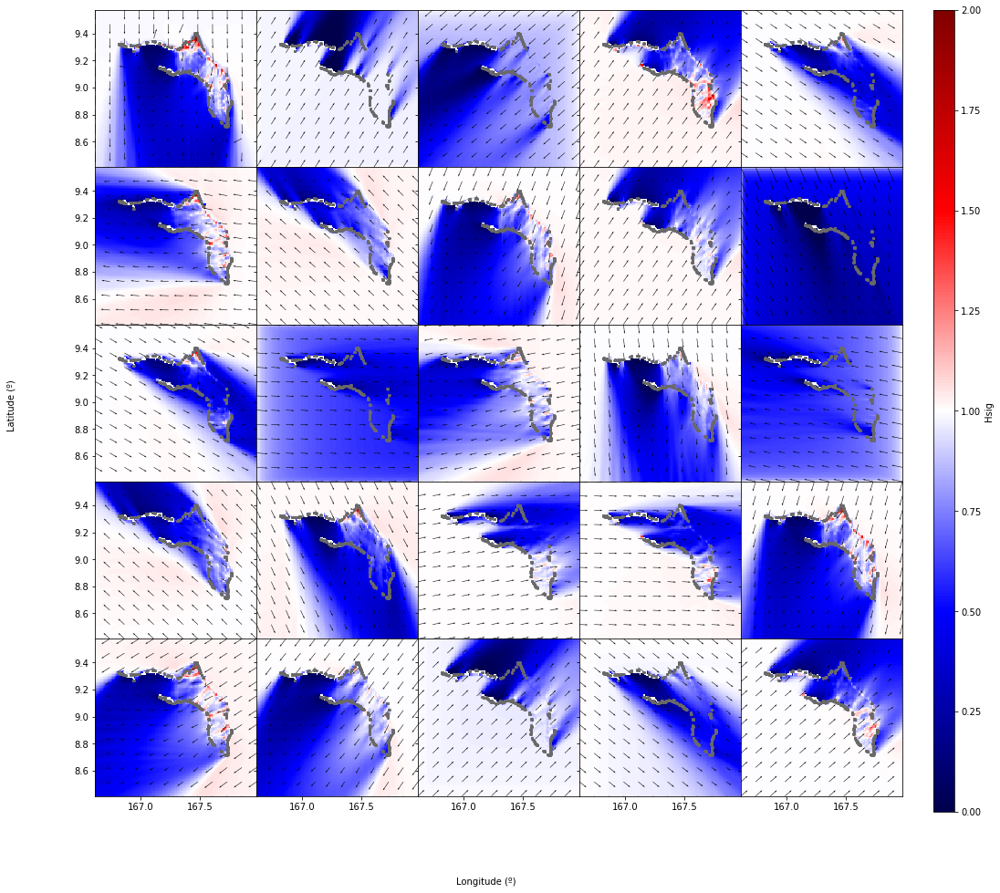

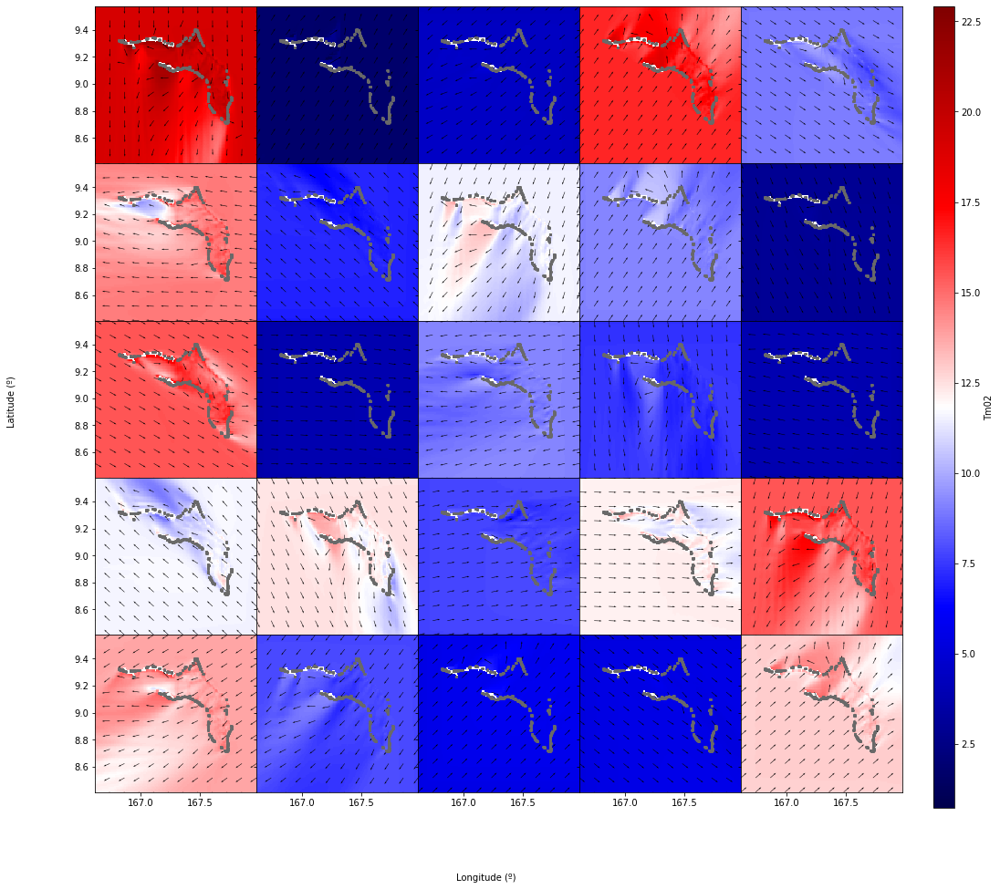

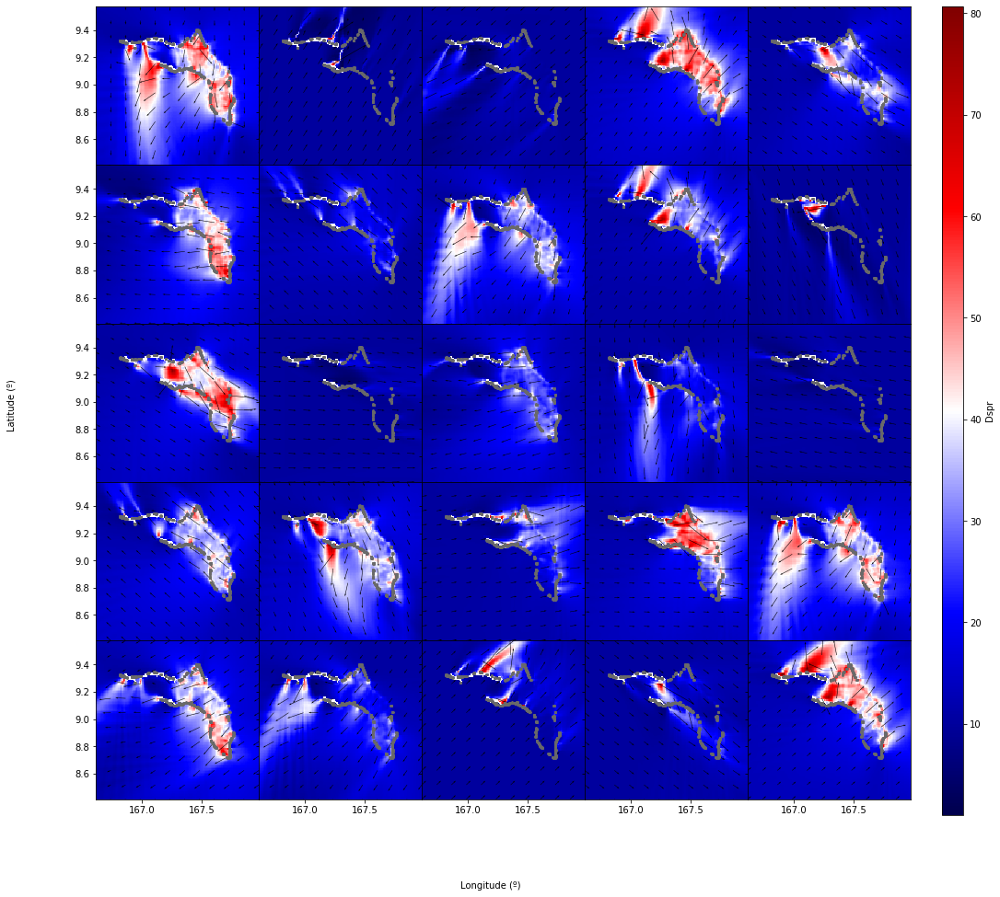

In [9]:
# extract output for main mesh
out_swl_mm_hist = sw.extract_output()
out_swl_mm_hist.to_netcdf(op.join(p_swan, 'out_main_swl.nc'))
print(out_swl_mm_hist)

# plot scatter maps
scatter_maps(out_swl_mm_hist, n_cases=25, var_limits={'Hsig':(0,2)}, np_shore=np_shore);


<xarray.Dataset>
Dimensions:  (case: 25, lat: 80, lon: 120)
Coordinates:
  * lon      (lon) float64 167.4 167.4 167.4 167.4 ... 167.5 167.5 167.5 167.5
  * lat      (lat) float64 9.351 9.351 9.353 9.354 ... 9.427 9.428 9.429 9.43
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 0.9400371 0.9127761 ... 0.186931
    Tm02     (case, lon, lat) float32 19.61152 19.424294 ... 13.039878 12.013787
    Dir      (case, lon, lat) float32 3.1409302 1.3945007 ... 200.66054
    Dspr     (case, lon, lat) float32 23.87725 20.58835 ... 25.207825 21.80204
    TPsmoo   (case, lon, lat) float32 22.25064 22.221874 ... 14.655663 14.587591


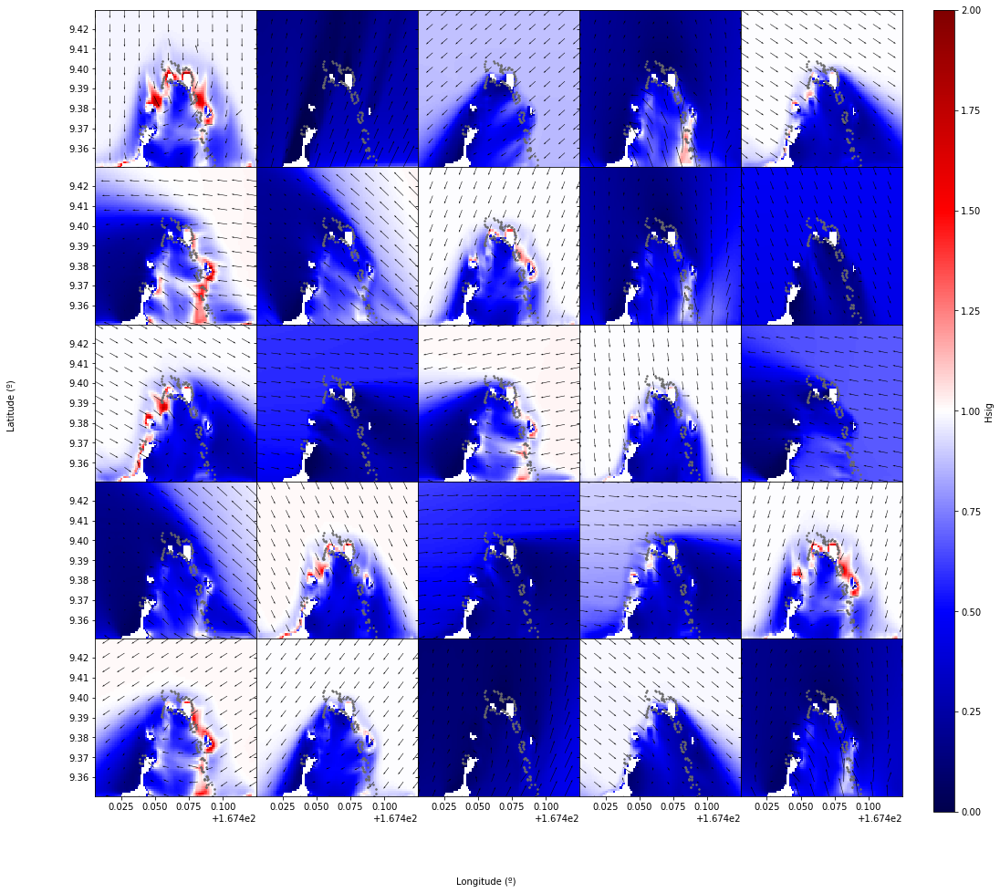

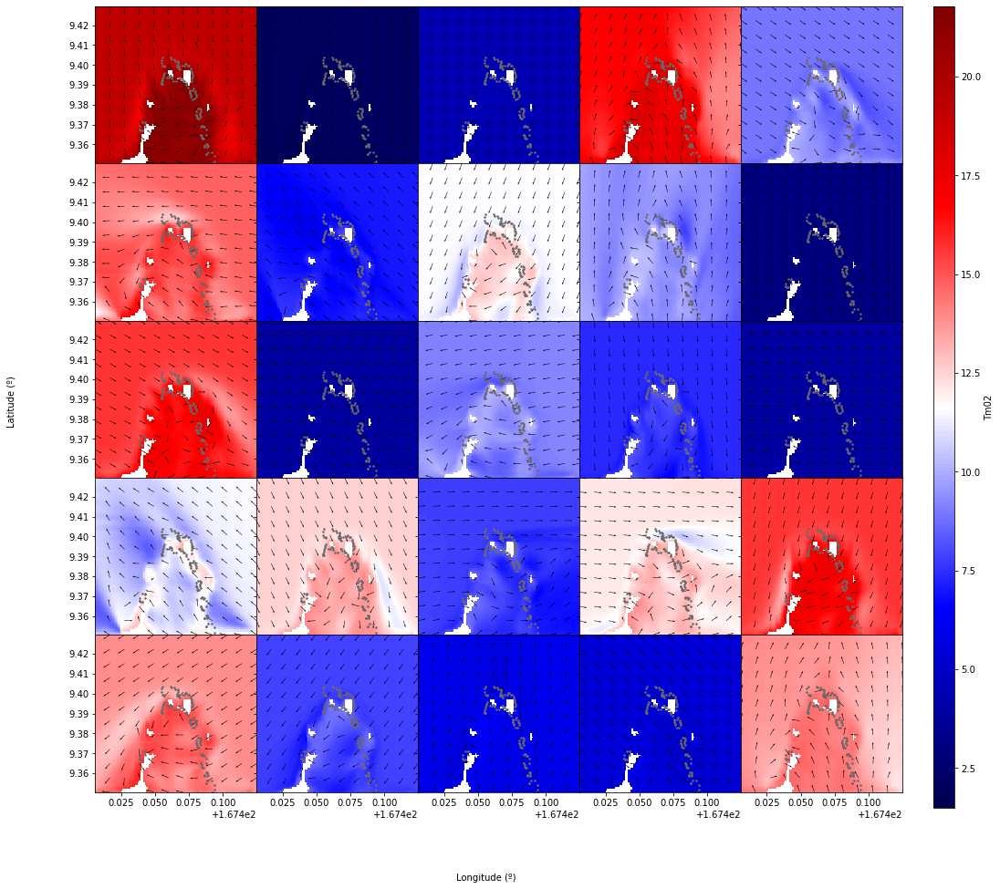

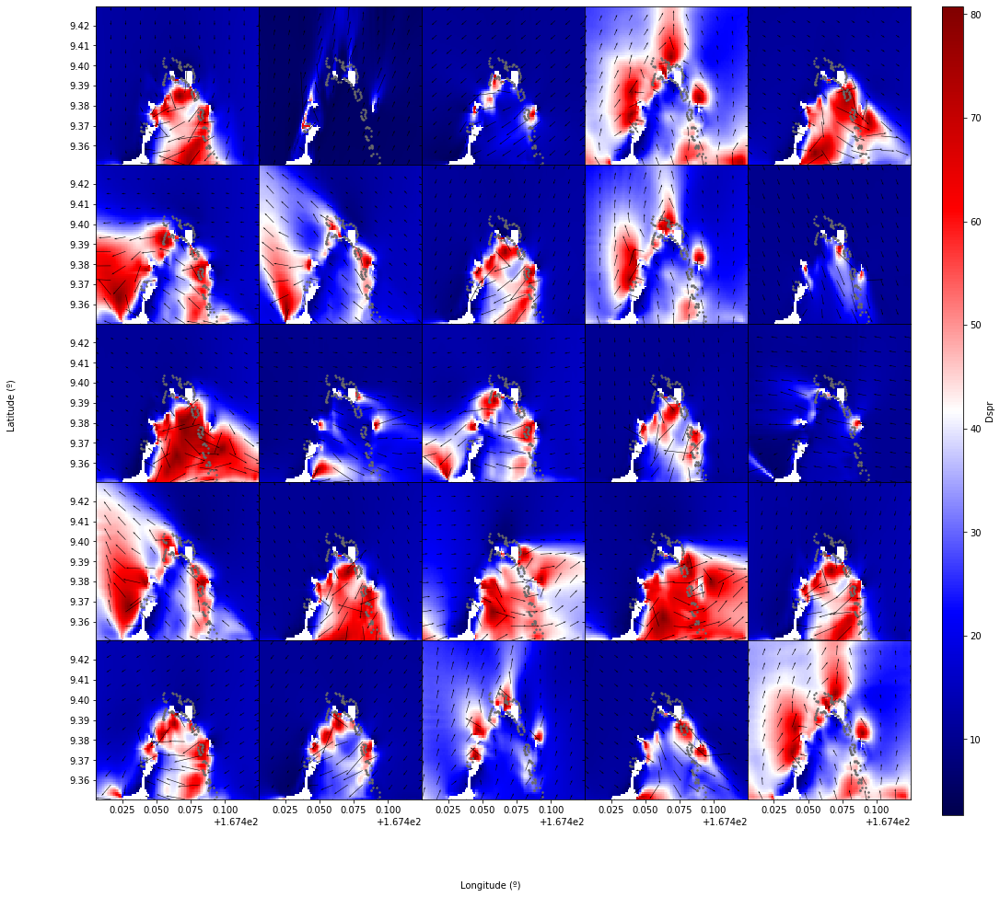

In [10]:
# extract output for nested mesh
out_swl_mn1_hist = sw.extract_output(mesh=sp.mesh_nest1)
out_sea_mn1_hist.to_netcdf(op.join(p_swan, 'out_nest1_swl.nc'))

print(out_swl_mn1_hist)

# plot scatter maps
scatter_maps(out_swl_mn1_hist, n_cases=25, var_limits={'Hsig':(0,2)}, np_shore=np_shore);



## RBF Reconstruction target: HISTORICAL Point SEA and SWELLs propagations

In [11]:
# point to reconstruct 
ix_lon, ix_lat = 62, 66

# Extract output waves at point (from nest1 mesh)
p1_sea = out_sea_mn1_hist.isel({'lon':ix_lon, 'lat':ix_lat}).to_dataframe()
p1_swl = out_swl_mn1_hist.isel({'lon':ix_lon, 'lat':ix_lat}).to_dataframe()

# store data
db_hist.Save('sea_target', p1_sea)
db_hist.Save('swl_target', p1_swl)



## SWAN: SIMULATION SEA waves 

In [12]:
# load Historical sea MDA subset
wvs_sea_subset = db_sim.Load('sea_subset')


# waves data hs and spr
wvs_sea_subset['hs'] = 1
wvs_sea_subset['spr'] = 40
wvs_sea_subset.rename(columns={'tp':'per'}, inplace=True)  # rename Tp for swan wrapper


# swan project
p_swan = db_sim.paths['swan_projects']
sp = SwanProject(p_swan, 'sea')

# main mesh: depth and computational grid 
sp.mesh_main.dg = main_grid.copy()
sp.mesh_main.cg = main_grid.copy()
sp.mesh_main.depth = np.loadtxt(p_swan_ext)

# nested mesh: depth and computational grid 
sp.mesh_nest1.dg = nested_grid.copy()
sp.mesh_nest1.cg = nested_grid.copy()
sp.mesh_nest1.depth = np.loadtxt(p_swan_int)

# activate nested mesh
sp.run_nest1 = True


# SWAN parameters 
sp.params = {
    'sea_level': 0,
    'jonswap_gamma': 3,
    'coords_spherical': 'CCM',
    'waves_period': 'PEAK',
    'nested_bounds': 'CLOSED',
}

    
# SWAN project wrapper
sw = SwanWrap_STAT(sp)

# build and launch cases
sw.build_cases(wvs_sea_subset)
sw.run_cases()


SWAN CASE: 0000 ---> hs    1.00, per   28.00, dir   85.99, spr   40.00
SWAN CASE: 0001 ---> hs    1.00, per    2.17, dir  266.87, spr   40.00
SWAN CASE: 0002 ---> hs    1.00, per    6.74, dir   86.90, spr   40.00
SWAN CASE: 0003 ---> hs    1.00, per   17.01, dir  311.55, spr   40.00
SWAN CASE: 0004 ---> hs    1.00, per   17.66, dir  176.65, spr   40.00
SWAN CASE: 0005 ---> hs    1.00, per    2.01, dir    1.53, spr   40.00
SWAN CASE: 0006 ---> hs    1.00, per    2.01, dir  171.83, spr   40.00
SWAN CASE: 0007 ---> hs    1.00, per   17.40, dir   80.41, spr   40.00
SWAN CASE: 0008 ---> hs    1.00, per   11.41, dir  241.83, spr   40.00
SWAN CASE: 0009 ---> hs    1.00, per   11.36, dir   16.01, spr   40.00
SWAN CASE: 0010 ---> hs    1.00, per    9.91, dir  152.94, spr   40.00
SWAN CASE: 0011 ---> hs    1.00, per    8.68, dir  309.78, spr   40.00
SWAN CASE: 0012 ---> hs    1.00, per    5.56, dir  218.07, spr   40.00
SWAN CASE: 0013 ---> hs    1.00, per    1.66, dir  118.89, spr   40.00
SWAN C

<xarray.Dataset>
Dimensions:  (case: 25, lat: 118, lon: 137)
Coordinates:
  * lon      (lon) float64 166.6 166.6 166.6 166.6 ... 167.9 168.0 168.0 168.0
  * lat      (lat) float64 8.411 8.42 8.43 8.44 8.45 ... 9.546 9.556 9.566 9.576
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 0.7196037 0.7191468 ... 1.0120873
    Tm02     (case, lon, lat) float32 20.416353 20.411533 ... 8.395132 8.395018
    Dir      (case, lon, lat) float32 104.73772 104.78342 ... 110.6861 110.67424
    Dspr     (case, lon, lat) float32 31.30417 31.33645 ... 39.36717 39.349174
    TPsmoo   (case, lon, lat) float32 28.985508 28.985508 ... 10.737108


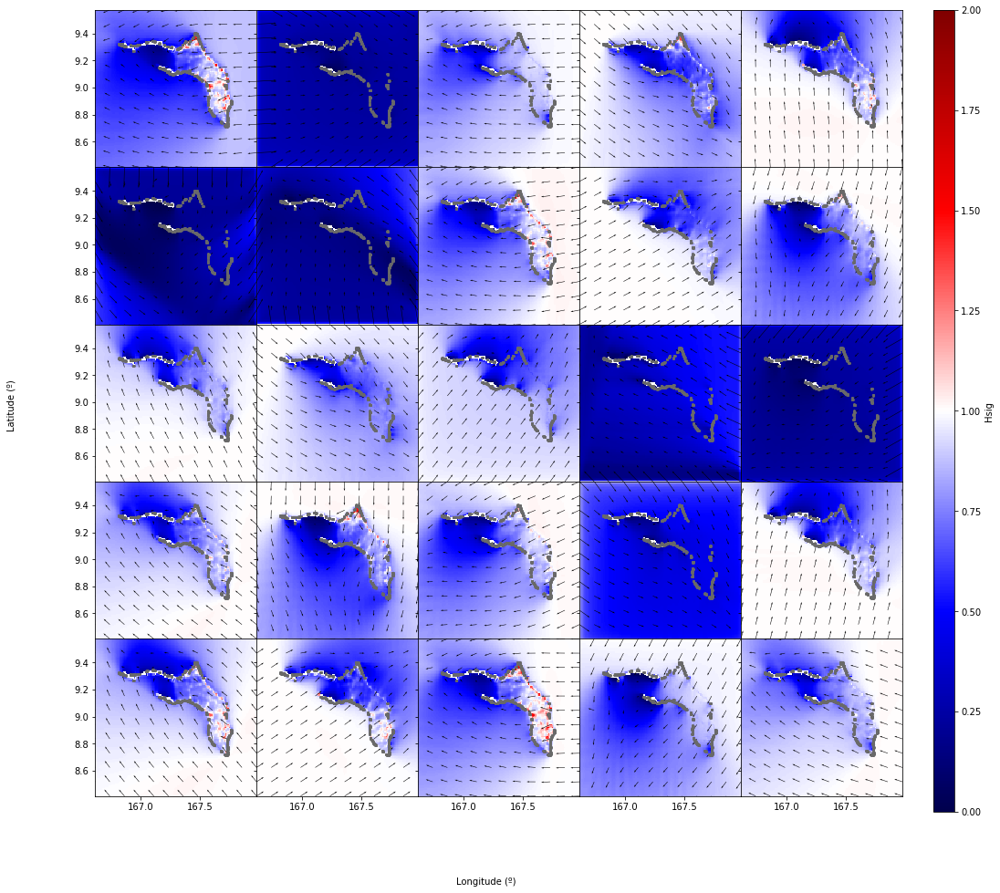

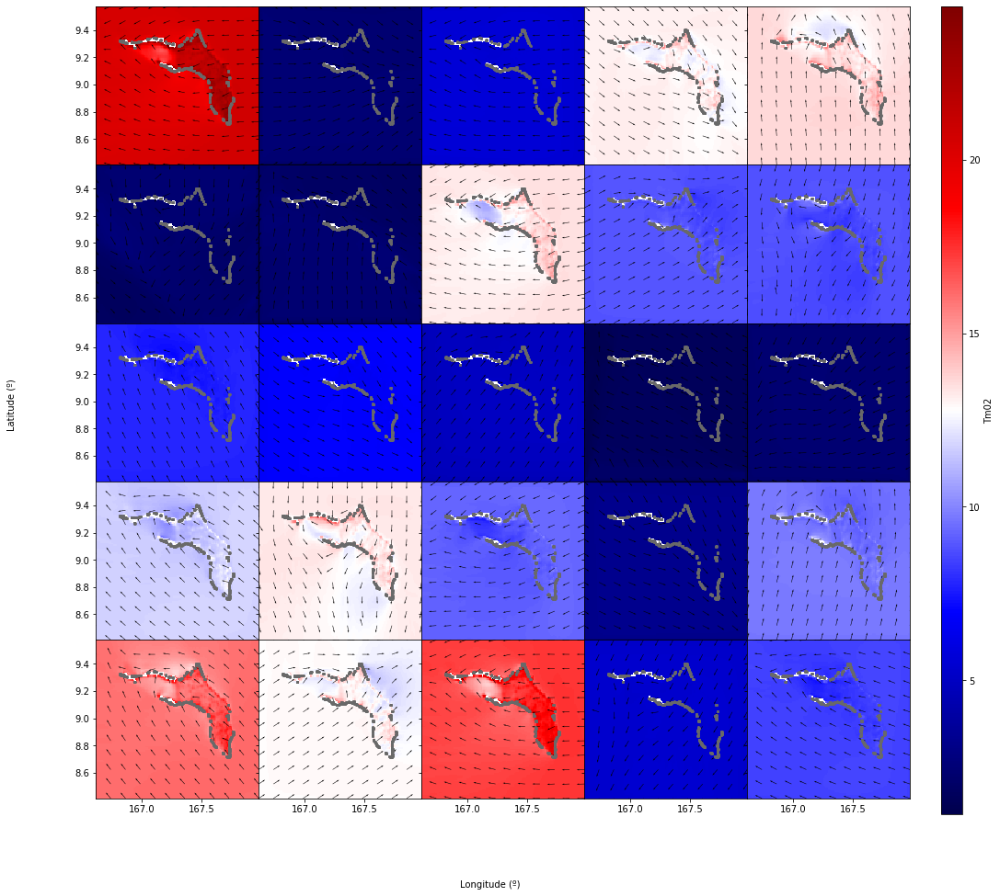

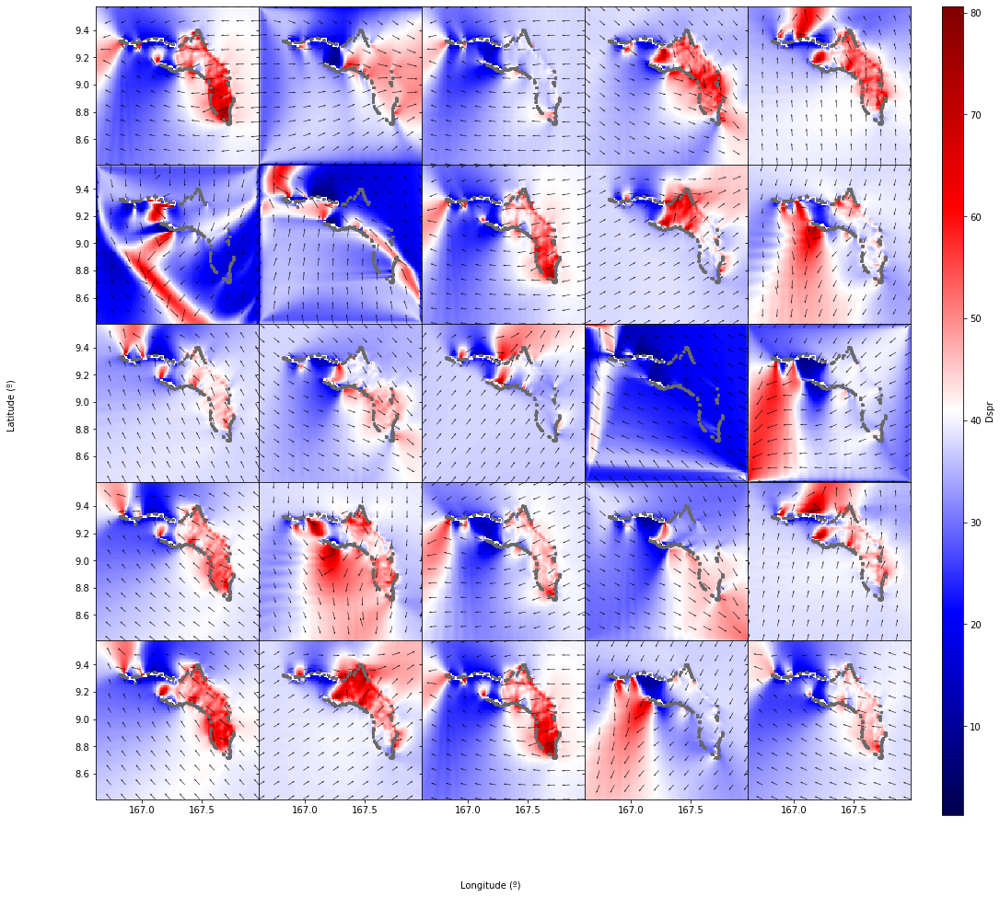

In [13]:
# extract output for main mesh
out_sea_mm_sim = sw.extract_output()
out_sea_mm_sim.to_netcdf(op.join(p_swan, 'out_main_sea.nc'))
print(out_sea_mm_sim)

# plot scatter maps
scatter_maps(out_sea_mm_sim, n_cases=25, var_limits={'Hsig':(0,2)}, np_shore=np_shore);


<xarray.Dataset>
Dimensions:  (case: 25, lat: 80, lon: 120)
Coordinates:
  * lon      (lon) float64 167.4 167.4 167.4 167.4 ... 167.5 167.5 167.5 167.5
  * lat      (lat) float64 9.351 9.351 9.353 9.354 ... 9.427 9.428 9.429 9.43
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 0.4708859 0.41419485 ... 0.1185975
    Tm02     (case, lon, lat) float32 19.99082 19.137955 ... 8.46463 8.266258
    Dir      (case, lon, lat) float32 67.486496 59.465515 ... 101.7068 198.0476
    Dspr     (case, lon, lat) float32 46.787315 48.18558 ... 34.595417 14.155132
    TPsmoo   (case, lon, lat) float32 28.10244 28.10244 ... 10.776105 10.681599


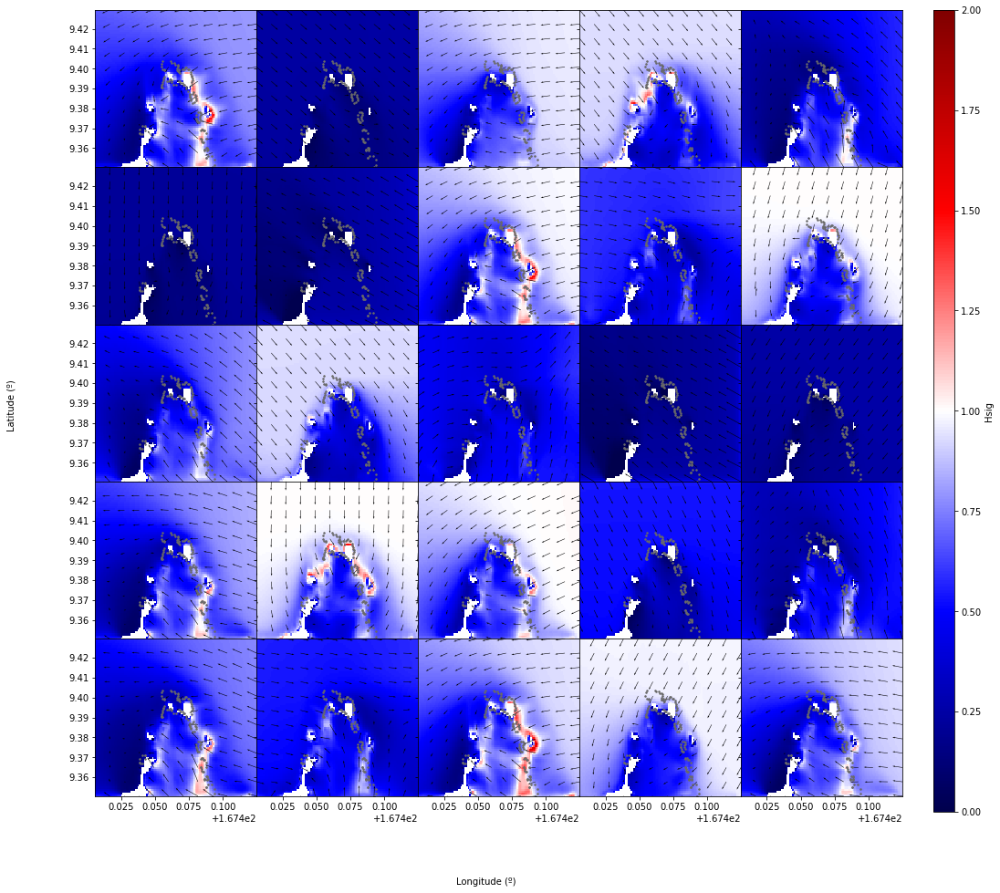

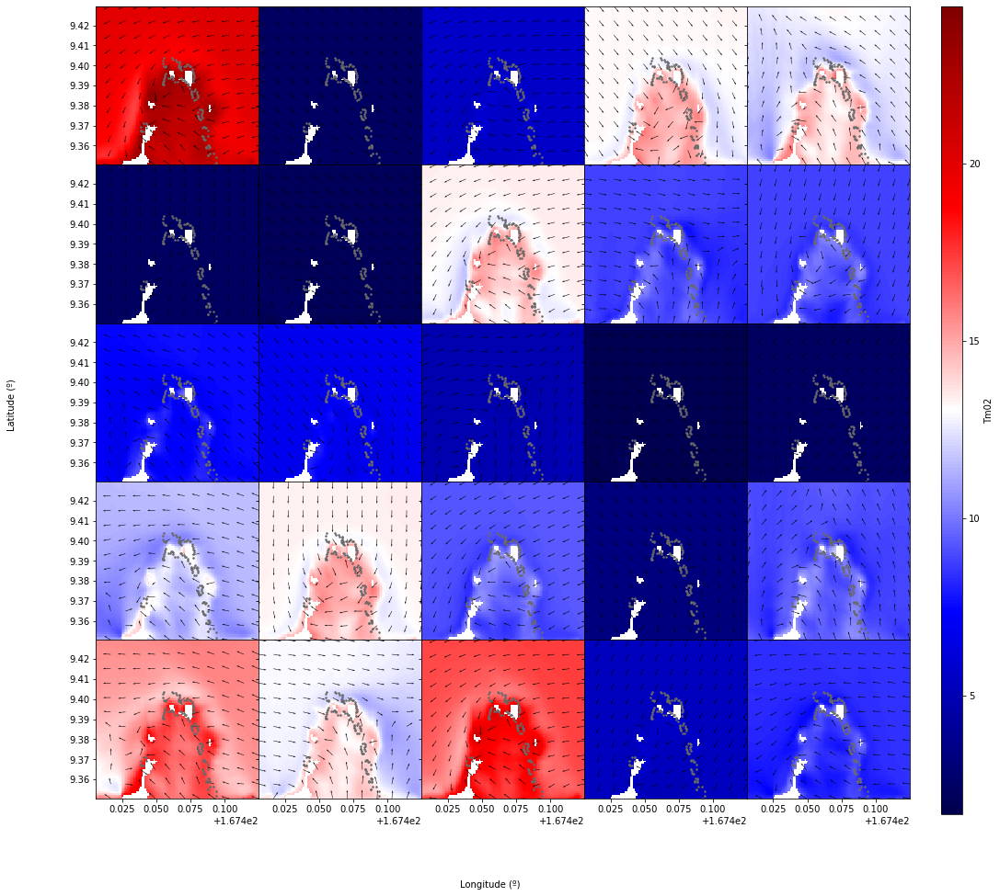

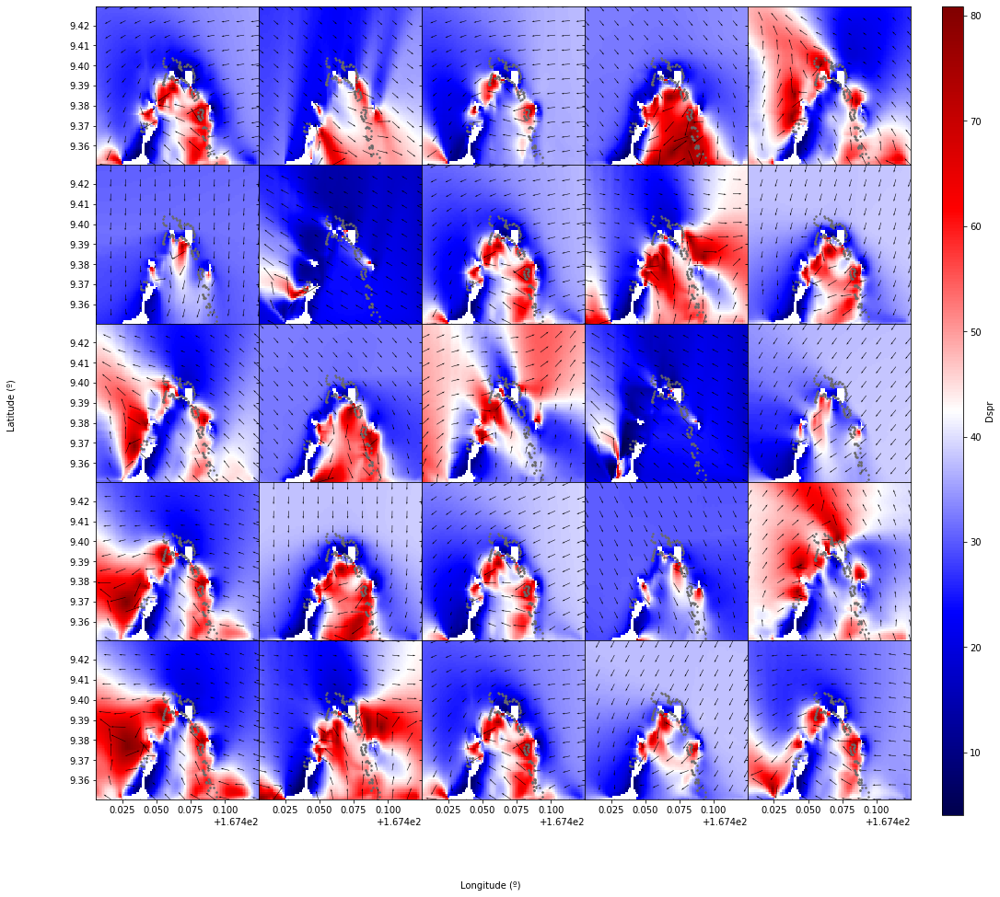

In [14]:
# extract output for nested mesh
out_sea_mn1_sim = sw.extract_output(mesh=sp.mesh_nest1)
out_sea_mn1_sim.to_netcdf(op.join(p_swan, 'out_nest1_sea.nc'))
print(out_sea_mn1_sim)

# plot scatter maps
scatter_maps(out_sea_mn1_sim, n_cases=25, var_limits={'Hsig':(0,2)}, np_shore=np_shore);



## SWAN: SIMULATION SWELL waves 

In [15]:
# load Historical sea MDA subset
wvs_swell_subset = db_sim.Load('swl_subset')


# waves data hs and spr
wvs_swell_subset['hs'] = 1
wvs_swell_subset['spr'] = 10
wvs_swell_subset.rename(columns={'tp':'per'}, inplace=True)  # rename Tp for swan wrapper


# swan project
p_swan = db_sim.paths['swan_projects']
sp = SwanProject(p_swan, 'swell')


# main mesh: depth and computational grid 
sp.mesh_main.dg = main_grid.copy()
sp.mesh_main.cg = main_grid.copy()
sp.mesh_main.depth = np.loadtxt(p_swan_ext)

# nested mesh: depth and computational grid 
sp.mesh_nest1.dg = nested_grid.copy()
sp.mesh_nest1.cg = nested_grid.copy()
sp.mesh_nest1.depth = np.loadtxt(p_swan_int)

# activate nested mesh
sp.run_nest1 = True


# SWAN parameters 
sp.params = {
    'sea_level': 0,
    'jonswap_gamma': 10,
    'coords_spherical': 'CCM',
    'waves_period': 'PEAK',
    'nested_bounds': 'CLOSED',
}

    
# SWAN project wrapper
sw = SwanWrap_STAT(sp)

# build and launch cases
sw.build_cases(wvs_swell_subset)
sw.run_cases()


SWAN CASE: 0000 ---> hs    1.00, per   24.98, dir  330.82, spr   10.00
SWAN CASE: 0001 ---> hs    1.00, per    2.88, dir  126.13, spr   10.00
SWAN CASE: 0002 ---> hs    1.00, per    4.50, dir  305.79, spr   10.00
SWAN CASE: 0003 ---> hs    1.00, per   16.64, dir  210.38, spr   10.00
SWAN CASE: 0004 ---> hs    1.00, per   16.80, dir   81.31, spr   10.00
SWAN CASE: 0005 ---> hs    1.00, per   14.25, dir  348.71, spr   10.00
SWAN CASE: 0006 ---> hs    1.00, per    5.86, dir  214.90, spr   10.00
SWAN CASE: 0007 ---> hs    1.00, per    5.21, dir   37.02, spr   10.00
SWAN CASE: 0008 ---> hs    1.00, per   23.78, dir  255.28, spr   10.00
SWAN CASE: 0009 ---> hs    1.00, per   11.07, dir  150.73, spr   10.00
SWAN CASE: 0010 ---> hs    1.00, per   12.38, dir  275.53, spr   10.00
SWAN CASE: 0011 ---> hs    1.00, per   21.39, dir   29.26, spr   10.00
SWAN CASE: 0012 ---> hs    1.00, per    9.54, dir   88.41, spr   10.00
SWAN CASE: 0013 ---> hs    1.00, per   18.79, dir  141.44, spr   10.00
SWAN C

<xarray.Dataset>
Dimensions:  (case: 25, lat: 118, lon: 137)
Coordinates:
  * lon      (lon) float64 166.6 166.6 166.6 166.6 ... 167.9 168.0 168.0 168.0
  * lat      (lat) float64 8.411 8.42 8.43 8.44 8.45 ... 9.546 9.556 9.566 9.576
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 0.9803559 0.9806323 ... 1.0037869
    Tm02     (case, lon, lat) float32 21.112932 21.114656 ... 7.9571166
    Dir      (case, lon, lat) float32 332.1068 332.13644 ... 307.51187 307.56198
    Dspr     (case, lon, lat) float32 14.410496 14.507282 ... 13.627304
    TPsmoo   (case, lon, lat) float32 24.53748 24.537542 ... 9.363293 9.363282


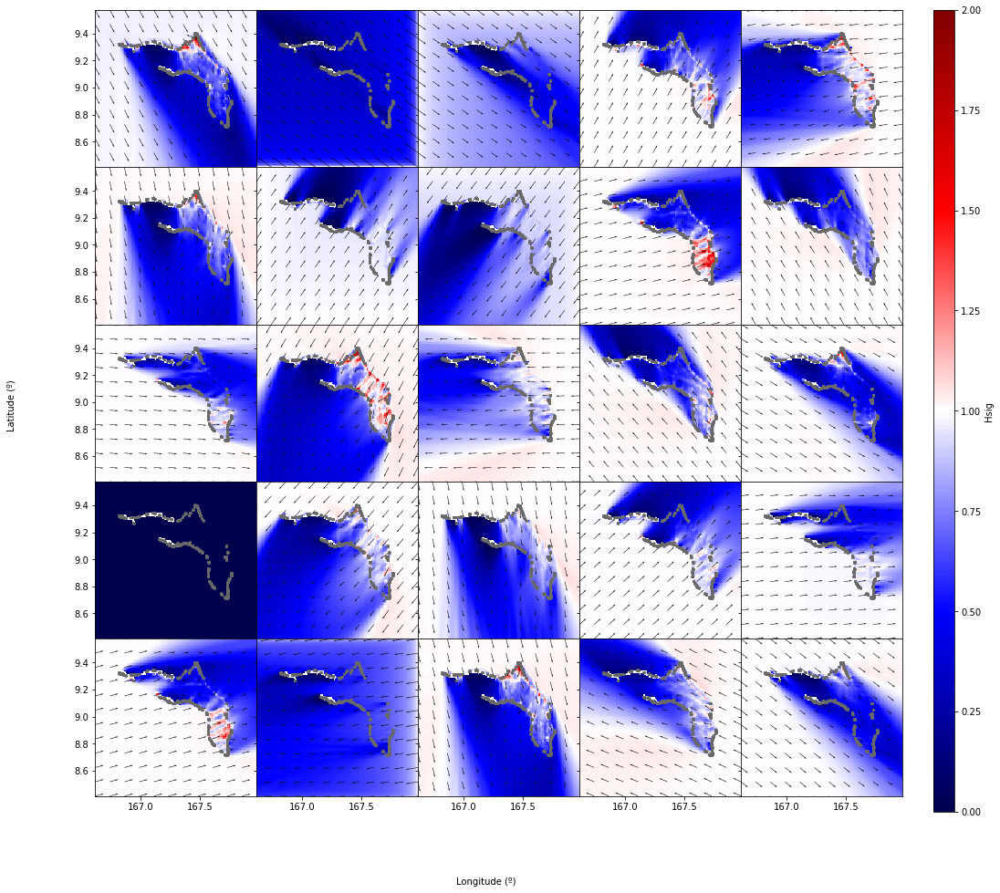

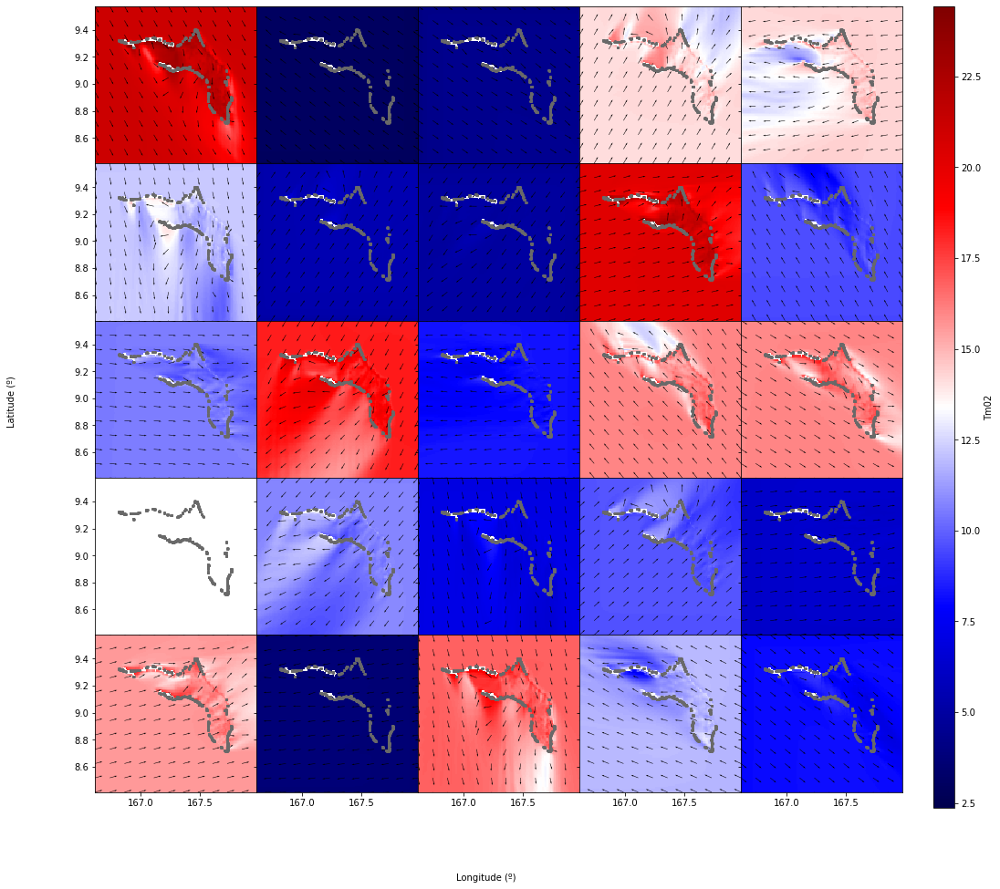

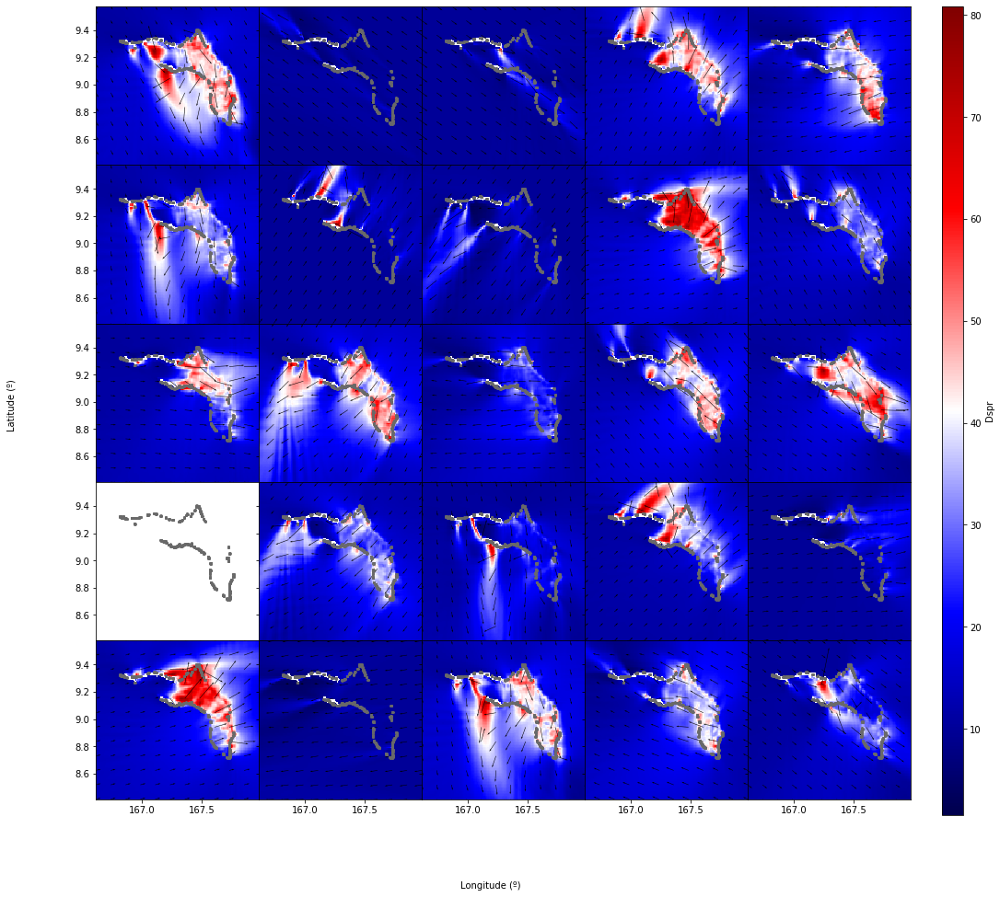

In [16]:
# extract output for main mesh
out_swl_mm_sim = sw.extract_output()
out_swl_mm_sim.to_netcdf(op.join(p_swan, 'out_main_swl.nc'))
print(out_swl_mm_sim)

# plot scatter maps
scatter_maps(out_swl_mm_sim, n_cases=25, var_limits={'Hsig':(0,2)}, np_shore=np_shore);


<xarray.Dataset>
Dimensions:  (case: 25, lat: 80, lon: 120)
Coordinates:
  * lon      (lon) float64 167.4 167.4 167.4 167.4 ... 167.5 167.5 167.5 167.5
  * lat      (lat) float64 9.351 9.351 9.353 9.354 ... 9.427 9.428 9.429 9.43
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 0.4708859 0.41419485 ... 0.1185975
    Tm02     (case, lon, lat) float32 19.99082 19.137955 ... 8.46463 8.266258
    Dir      (case, lon, lat) float32 67.486496 59.465515 ... 101.7068 198.0476
    Dspr     (case, lon, lat) float32 46.787315 48.18558 ... 34.595417 14.155132
    TPsmoo   (case, lon, lat) float32 28.10244 28.10244 ... 10.776105 10.681599


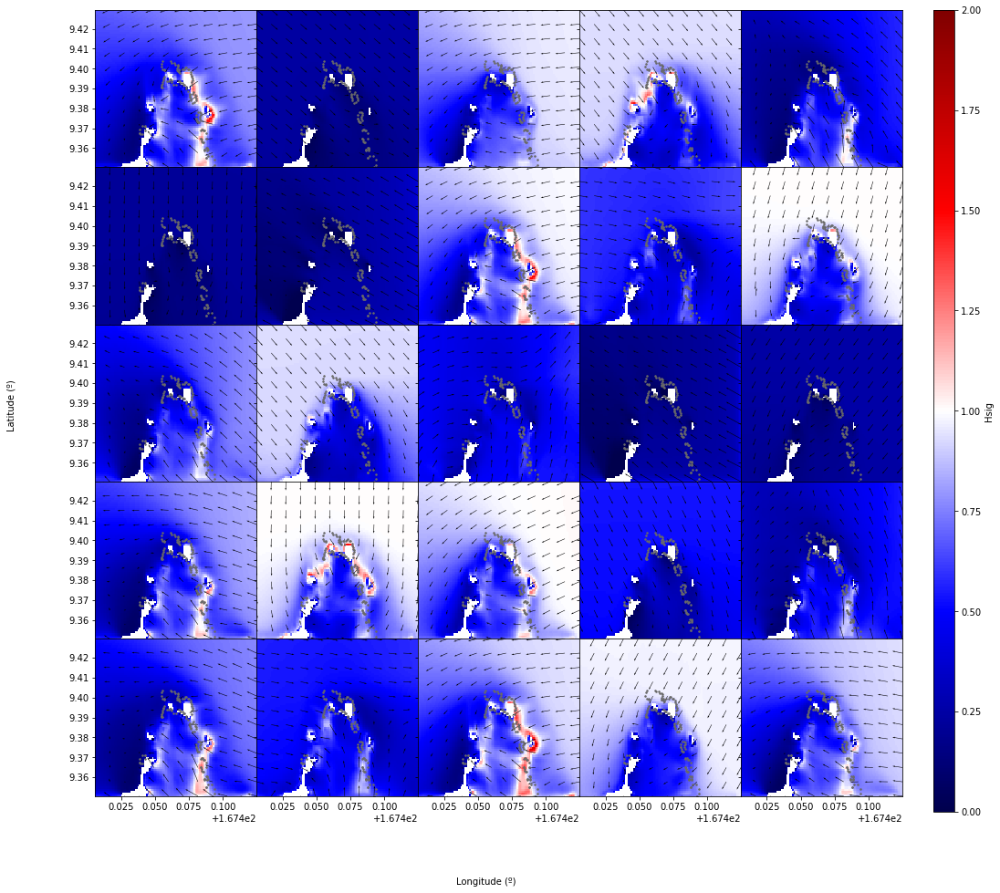

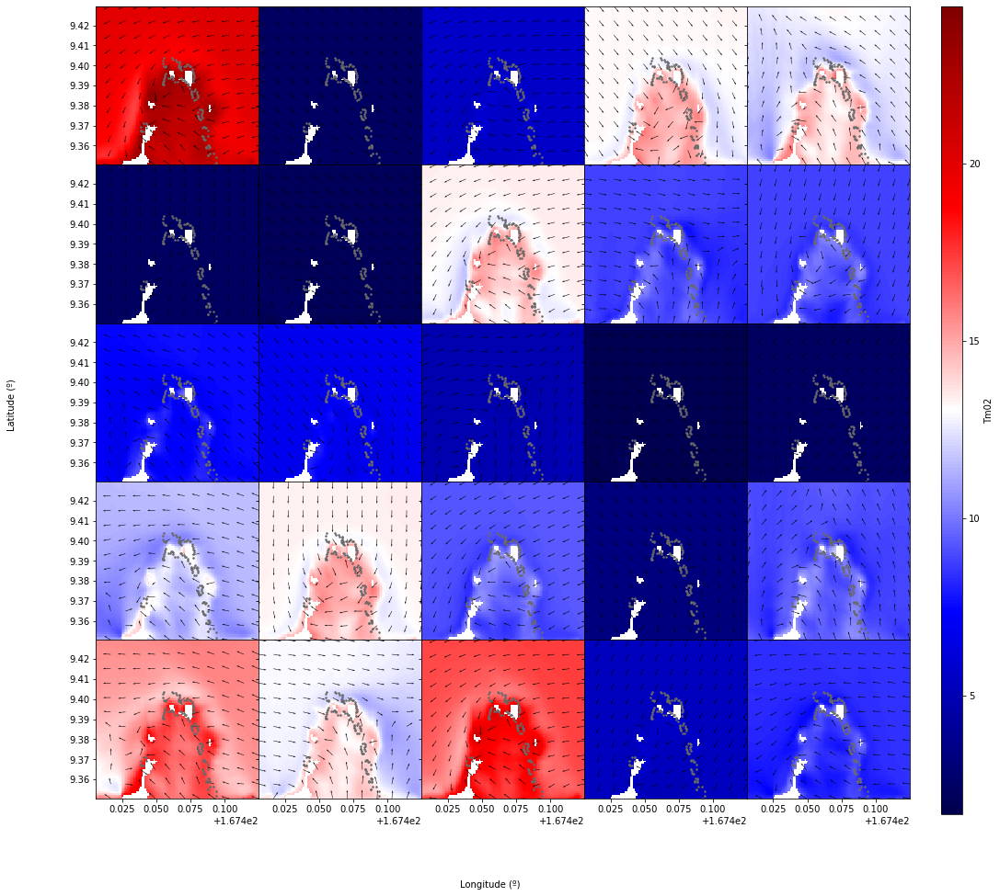

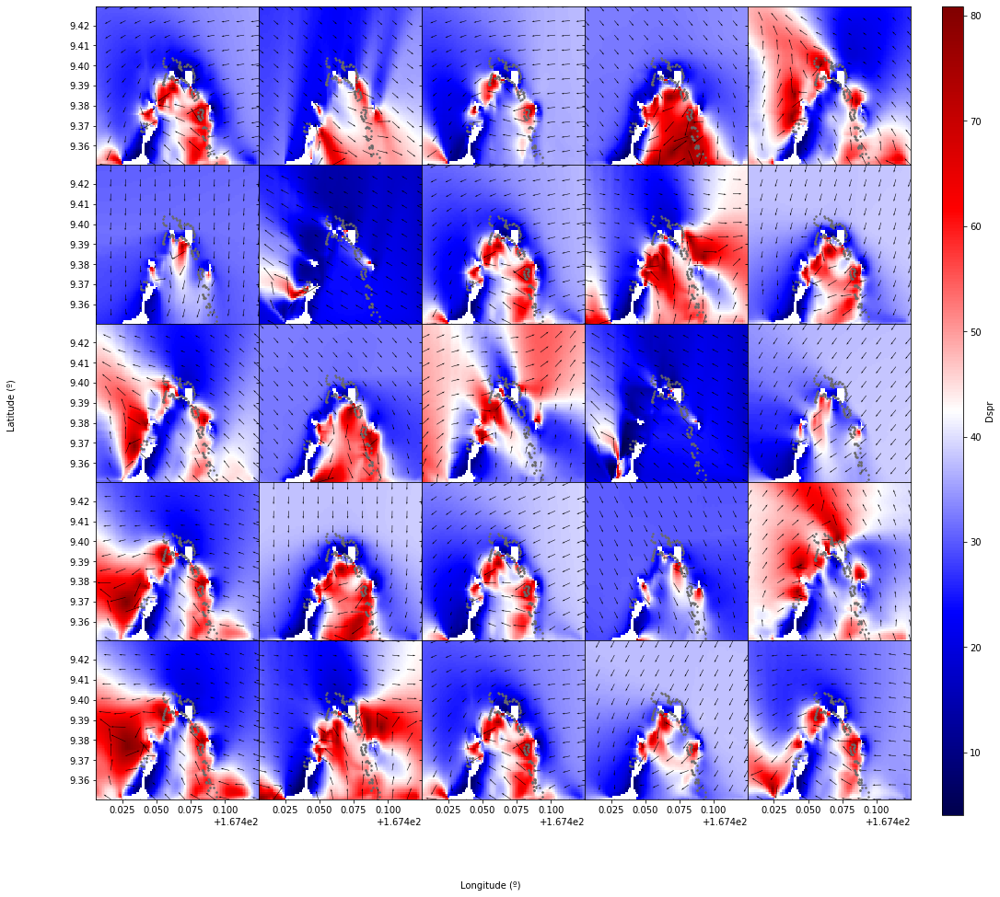

In [17]:
# extract output for nested mesh
out_swl_mn1_sim = sw.extract_output(mesh=sp.mesh_nest1)
out_swl_mn1_sim.to_netcdf(op.join(p_swan, 'out_nest1_swl.nc'))
print(out_sea_mn1_sim)

# plot scatter maps
scatter_maps(out_sea_mn1_sim, n_cases=25, var_limits={'Hsig':(0,2)}, np_shore=np_shore);



## RBF Reconstruction target: SIMULATION Point SEA and SWELLs propagations

In [18]:
# point to reconstruct 
ix_lon, ix_lat = 62, 66

# Extract output waves at point (from nest1 mesh)
p1_sea = out_sea_mn1_sim.isel({'lon':ix_lon, 'lat':ix_lat}).to_dataframe()
p1_swl = out_swl_mn1_sim.isel({'lon':ix_lon, 'lat':ix_lat}).to_dataframe()

# store data
db_sim.Save('sea_target', p1_sea)
db_sim.Save('swl_target', p1_swl)
